<a href="https://colab.research.google.com/github/nivedabhat/bank-customer-churn-prediction-ann/blob/main/bank_customer_churn_prediction_ann.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Bank Churn Prediction - Problem Statement

## Problem Statement

### Context

Businesses like banks which provide service have to worry about problem of 'Customer Churn' i.e. customers leaving and joining another service provider. It is important to understand which aspects of the service influence a customer's decision in this regard. Management can concentrate efforts on improvement of service, keeping in mind these priorities.

### Objective

Given a Bank customer, build a neural network-based classifier that can determine whether they will leave or not in the next 6 months.

### Data Dictionary:

* CustomerId: Unique ID which is assigned to each customer

* Surname: Last name of the customer

* CreditScore: It defines the credit history of the customer.
  
* Geography: A customer’s location
   
* Gender: It defines the Gender of the customer
   
* Age: Age of the customer
    
* Tenure: Number of years for which the customer has been with the bank

* NumOfProducts: refers to the number of products that a customer has purchased through the bank.

* Balance: Account balance

* HasCrCard: It is a categorical variable which decides whether the customer has credit card or not.

* EstimatedSalary: Estimated salary

* isActiveMember: Is is a categorical variable which decides whether the customer is active member of the bank or not ( Active member in the sense, using bank products regularly, making transactions etc )

* Exited : whether or not the customer left the bank within six month. It can take two values
** 0=No ( Customer did not leave the bank )
** 1=Yes ( Customer left the bank )

## Importing necessary libraries

In [ ]:
#!pip install --no-index -f https://github.com/dreoporto/ptmlib/releases ptmlib;
# installing a specific tensorflow version
!pip install tensorflow==2.15.0 -q -user
# checking if the specified version is installed
import tensorflow as tf
tf.__version__


Usage:   
  pip3 install [options] <requirement specifier> [package-index-options] ...
  pip3 install [options] -r <requirements file> [package-index-options] ...
  pip3 install [options] [-e] <vcs project url> ...
  pip3 install [options] [-e] <local project path> ...
  pip3 install [options] <archive url/path> ...

no such option: -u


'2.15.0'

In [ ]:
# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Library to split data
from sklearn.model_selection import train_test_split

# library to import to standardize the data
from sklearn.preprocessing import StandardScaler, LabelEncoder

# importing different functions to build models
import tensorflow as tf
from tensorflow import keras
from keras import backend
from keras.models import Sequential
from keras.layers import Dense, Dropout

# importing SMOTE
from imblearn.over_sampling import SMOTE

# importing metrics
from sklearn.metrics import confusion_matrix,roc_curve,classification_report,recall_score

import random

# Library to avoid the warnings
import warnings
warnings.filterwarnings("ignore")

## Loading the dataset

In [ ]:
#| code-summary: Loading the dataset and making a copy
file_path = '/BankChurners.csv'
data = pd.read_csv(file_path)
df = data.copy()

## Data Overview

The initial steps to get an overview of any dataset is to:
- Observe the first few rows of the dataset, to check whether the dataset has been loaded properly or not
- Get information about the number of rows and columns in the dataset
- Find out the data types of the columns to ensure that data is stored in the preferred format and the value of each property is as expected.
- Check the statistical summary of the dataset to get an overview of the numerical columns of the data

In [ ]:
#| code-summary: Previewing the dataset.
#| label: tbl-initial
#| tbl-cap: Initial sample of the dataset
#| tbl-cap-location: top
df.sample(10)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
8208,711683358,Attrited Customer,46,F,3,High School,NaN,Less than $40K,Blue,41,...,3,4,3313.0,0,3313.0,0.561,2135,44,0.419,0.000
9158,713131158,Attrited Customer,58,M,2,Uneducated,Single,$80K - $120K,Blue,46,...,3,1,10286.0,0,10286.0,0.908,8199,59,0.903,0.000
2187,712933083,Existing Customer,37,M,1,Uneducated,Single,$80K - $120K,Blue,36,...,1,2,3127.0,2378,749.0,0.862,2292,49,0.441,0.760
848,721250358,Existing Customer,50,M,2,NaN,Married,$40K - $60K,Blue,36,...,1,3,5426.0,1478,3948.0,0.664,1266,22,0.571,0.272
5848,781110408,Existing Customer,39,F,0,High School,Single,Less than $40K,Blue,23,...,3,2,3279.0,0,3279.0,0.765,5048,75,0.923,0.000
7445,818710233,Existing Customer,41,F,2,Graduate,Married,$40K - $60K,Blue,36,...,2,3,2329.0,1271,1058.0,0.729,4382,70,0.667,0.546
3783,771922008,Existing Customer,57,F,2,NaN,Single,Less than $40K,Blue,46,...,2,2,5443.0,1889,3554.0,0.421,4416,64,0.600,0.347
8319,718152333,Attrited Customer,41,F,3,Doctorate,Single,abc,Blue,36,...,3,6,2246.0,0,2246.0,0.725,3607,51,0.821,0.000
5082,710854008,Existing Customer,48,M,3,NaN,NaN,$40K - $60K,Blue,37,...,2,4,6541.0,1119,5422.0,0.496,3902,63,0.432,0.171
3307,712319958,Existing Customer,41,M,4,High School,Married,$80K - $120K,Blue,29,...,2,1,12154.0,2517,9637.0,0.864,3853,71,0.775,0.207


In [ ]:
#| code-summary: Preview the shape of the dataset.
df.shape

(10127, 21)

There are `{python} df.shape[0]` rows and `{python} df.shape[1]` columns in the dataset.

In [ ]:
#| code-summary: View the various datatypes.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

- Some of these may be converted to categorical (credit score as ranges, gender, geography, hascrcard,
isactivemember, exited).
- RowNumber and CustomerId can be dropped, as they will not be used in the model.

In [ ]:
#| code-summary: Preview the statistical summary of the dataset.
#| label: tbl-describe
#| tbl-cap: Statistical summary of the dataset
#| tbl-cap-location: top
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,7.391776e+08,3.690378e+07,708082083.0,7.130368e+08,7.179264e+08,7.731435e+08,8.283431e+08
Customer_Age,10127.0,4.632596e+01,8.016814e+00,26.0,4.100000e+01,4.600000e+01,5.200000e+01,7.300000e+01
Dependent_count,10127.0,2.346203e+00,1.298908e+00,0.0,1.000000e+00,2.000000e+00,3.000000e+00,5.000000e+00
Months_on_book,10127.0,3.592841e+01,7.986416e+00,13.0,3.100000e+01,3.600000e+01,4.000000e+01,5.600000e+01
Total_Relationship_Count,10127.0,3.812580e+00,1.554408e+00,1.0,3.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00
Months_Inactive_12_mon,10127.0,2.341167e+00,1.010622e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Contacts_Count_12_mon,10127.0,2.455317e+00,1.106225e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Credit_Limit,10127.0,8.631954e+03,9.088777e+03,1438.3,2.555000e+03,4.549000e+03,1.106750e+04,3.451600e+04
Total_Revolving_Bal,10127.0,1.162814e+03,8.149873e+02,0.0,3.590000e+02,1.276000e+03,1.784000e+03,2.517000e+03
Avg_Open_To_Buy,10127.0,7.469140e+03,9.090685e+03,3.0,1.324500e+03,3.474000e+03,9.859000e+03,3.451600e+04


- Credit score ranges from 350 to 850, with an average of 650 and a median of 652. Standard deviation is high, at 97.
- Age ranges from 18 to 92, with an average of 39 and median of 37.
- These will be examined in-depth in @sec-initial_eda, below.

In [ ]:
#| code-summary: Preview the number of unique values in the dataset.
df.nunique()

CLIENTNUM                   10127
Attrition_Flag                  2
Customer_Age                   45
Gender                          2
Dependent_count                 6
Education_Level                 6
Marital_Status                  3
Income_Category                 6
Card_Category                   4
Months_on_book                 44
Total_Relationship_Count        6
Months_Inactive_12_mon          7
Contacts_Count_12_mon           7
Credit_Limit                 6205
Total_Revolving_Bal          1974
Avg_Open_To_Buy              6813
Total_Amt_Chng_Q4_Q1         1158
Total_Trans_Amt              5033
Total_Trans_Ct                126
Total_Ct_Chng_Q4_Q1           830
Avg_Utilization_Ratio         964
dtype: int64

- RowNumber CustomerId, and Surname can be dropped, as they are unique and will not be used in the model.

In [ ]:
#| code-summary: Check for missing values in the dataset.
df.isnull().sum()

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

- There are no missing values in the dataset.

In [ ]:
#| code-summary: Calculate the Interquartile Range (IQR) of the dataset.
num_cols = df.select_dtypes(include=['int64', 'float64'])
Q1 = num_cols.quantile(0.25)  # To find the 25th percentile
Q3 = num_cols.quantile(0.75)  # To find the 75th percentile

IQR = Q3 - Q1  # Inter Quantile Range (75th perentile - 25th percentile)

# Finding lower and upper bounds for all values. All values outside these bounds are outliers
lower = Q1 - 1.5 * IQR
upper = Q3 + 1.5 * IQR

In [ ]:
#| code-summary: Checking the percentage of outliers
(
        (df.select_dtypes(include=["float64", "int64"]) < lower)
        | (df.select_dtypes(include=["float64", "int64"]) > upper)
).sum() / len(data) * 100

CLIENTNUM                   0.000000
Customer_Age                0.019749
Dependent_count             0.000000
Months_on_book              3.811593
Total_Relationship_Count    0.000000
Months_Inactive_12_mon      3.268490
Contacts_Count_12_mon       6.211119
Credit_Limit                9.716599
Total_Revolving_Bal         0.000000
Avg_Open_To_Buy             9.509233
Total_Amt_Chng_Q4_Q1        3.910339
Total_Trans_Amt             8.847635
Total_Trans_Ct              0.019749
Total_Ct_Chng_Q4_Q1         3.890590
Avg_Utilization_Ratio       0.000000
dtype: float64

In [ ]:
#| code-summary: Define clean_headers() function
"""
Clean and standardize column headers for a DataFrame.
"""
import re
from typing import Any, Dict, List, Optional, Union
from unicodedata import normalize

import dask.dataframe as dd
import numpy as np
import pandas as pd

NULL_VALUES = {np.nan, "", None}

CASE_STYLES = {
    "snake",
    "kebab",
    "camel",
    "pascal",
    "const",
    "sentence",
    "title",
    "lower",
    "upper",
}


def clean_headers(
        df: Union[pd.DataFrame, dd.DataFrame],
        case: str = "snake",
        replace: Optional[Dict[str, str]] = None,
        remove_accents: bool = True,
        report: bool = True,
) -> pd.DataFrame:
    """
    Function to clean column headers (column names).

    Read more in the :ref:`User Guide <clean_headers_user_guide>`.

    Parameters
    ----------
    df
        Dataframe from which column names are to be cleaned.
    case
        The desired case style of the column name.
            - 'snake': 'column_name'
            - 'kebab': 'column-name'
            - 'camel': 'columnName'
            - 'pascal': 'ColumnName'
            - 'const': 'COLUMN_NAME'
            - 'sentence': 'Column name'
            - 'title': 'Column Name'
            - 'lower': 'column name'
            - 'upper': 'COLUMN NAME'

        (default: 'snake')
    replace
        Values to replace in the column names.
            - {'old_value': 'new_value'}

        (default: None)
    remove_accents
        If True, strip accents from the column names.

        (default: True)
    report
        If True, output the summary report. Otherwise, no report is outputted.

        (default: True)

    Examples
    --------
    Clean column names by converting the names to camel case style, removing accents,
    and correcting a mispelling.

    >>> df = pd.DataFrame({'FirstNom': ['Philip', 'Turanga'], 'lastName': ['Fry', 'Leela'], \
'Téléphone': ['555-234-5678', '(604) 111-2335']})
    >>> clean_headers(df, case='camel', replace={'Nom': 'Name'})
    Column Headers Cleaning Report:
        2 values cleaned (66.67%)
      firstName lastName       telephone
    0    Philip      Fry    555-234-5678
    1   Turanga    Leela  (604) 111-2335
    """
    if case not in CASE_STYLES:
        raise ValueError(
            f"case {case} is invalid, it needs to be one of {', '.join(c for c in CASE_STYLES)}"
        )

    # Store original column names for creating cleaning report
    orig_columns = df.columns.astype(str).tolist()

    if replace:
        df = df.rename(columns=lambda col: _replace_values(col, replace))

    if remove_accents:
        df = df.rename(columns=_remove_accents)

    df = df.rename(columns=lambda col: _convert_case(col, case))

    df.columns = _rename_duplicates(df.columns, case)

    # Count the number of changed column names
    new_columns = df.columns.astype(str).tolist()
    cleaned = [1 if new_columns[i] != orig_columns[i] else 0 for i in range(len(orig_columns))]
    stats = {"cleaned": sum(cleaned)}

    # Output a report describing the result of clean_headers
    if report:
        _create_report(stats, len(df.columns))

    return df


def _convert_case(name: Any, case: str) -> Any:
    """
    Convert case style of a column name.

    Parameters
    ----------
    name
        Column name.
    case
        The desired case style of the column name.
    """
    if name in NULL_VALUES:
        name = "header"

    if case in {"snake", "kebab", "camel", "pascal", "const"}:
        words = _split_strip_string(str(name))
    else:
        words = _split_string(str(name))

    if case == "snake":
        name = "_".join(words).lower()
    elif case == "kebab":
        name = "-".join(words).lower()
    elif case == "camel":
        name = words[0].lower() + "".join(w.capitalize() for w in words[1:])
    elif case == "pascal":
        name = "".join(w.capitalize() for w in words)
    elif case == "const":
        name = "_".join(words).upper()
    elif case == "sentence":
        name = " ".join(words).capitalize()
    elif case == "title":
        name = " ".join(w.capitalize() for w in words)
    elif case == "lower":
        name = " ".join(words).lower()
    elif case == "upper":
        name = " ".join(words).upper()

    return name


def _split_strip_string(string: str) -> List[str]:
    """
    Split the string into separate words and strip punctuation
    and special characters.
    """
    string = re.sub(r"[!()*+\,\-./:;<=>?[\]^_{|}~]", " ", string)
    string = re.sub(r"[\'\"\`]", "", string)

    return re.sub(r"([A-Z][a-z]+)", r" \1", re.sub(r"([A-Z]+|[0-9]+|\W+)", r" \1", string)).split()


def _split_string(string: str) -> List[str]:
    """
    Split the string into separate words.
    """
    string = re.sub(r"[\-_]", " ", string)

    return re.sub(r"([A-Z][a-z]+)", r" \1", re.sub(r"([A-Z]+)", r"\1", string)).split()


def _replace_values(name: Any, mapping: Dict[str, str]) -> Any:
    """
    Replace string values in the column name.

    Parameters
    ----------
    name
        Column name.
    mapping
        Maps old values in the column name to the new values.
    """
    if name in NULL_VALUES:
        return name

    name = str(name)
    for old_value, new_value in mapping.items():
        # If the old value or the new value is not alphanumeric, add underscores to the
        # beginning and end so the new value will be parsed correctly for _convert_case()
        new_val = (
            rf"{new_value}" if old_value.isalnum() and new_value.isalnum() else rf"_{new_value}_"
        )
        name = re.sub(rf"{old_value}", new_val, name, flags=re.IGNORECASE)

    return name


def _remove_accents(name: Any) -> Any:
    """
    Return the normal form for a Unicode string name using canonical
    decomposition.
    """
    if not isinstance(name, str):
        return name

    return normalize("NFD", name).encode("ascii", "ignore").decode("ascii")


def _rename_duplicates(names: pd.Index, case: str) -> Any:
    """
    Rename duplicated column names to append a number at the end.
    """
    if case in {"snake", "const"}:
        sep = "_"
    elif case in {"camel", "pascal"}:
        sep = ""
    elif case == "kebab":
        sep = "-"
    else:
        sep = " "

    names = list(names)
    counts: Dict[str, int] = {}

    for i, col in enumerate(names):
        cur_count = counts.get(col, 0)
        if cur_count > 0:
            names[i] = f"{col}{sep}{cur_count}"
        counts[col] = cur_count + 1

    return names


def _create_report(stats: Dict[str, int], ncols: int) -> None:
    """
    Describe what was done in the cleaning process.
    """
    print("Column Headers Cleaning Report:")
    if stats["cleaned"] > 0:
        nclnd = stats["cleaned"]
        pclnd = round(nclnd / ncols * 100, 2)
        print(f"\t{nclnd} values cleaned ({pclnd}%)")

# Source: https://github.com/sfu-db/dataprep/blob/develop/dataprep/clean/clean_headers.py#L27C1-L33C19
# Installing the package causes dependency problems, so this section was copied directly.

In [ ]:
#| code-summary: Clean the headers.
df = clean_headers(df)

Column Headers Cleaning Report:
	21 values cleaned (100.0%)


## Exploratory Data Analysis {#sec-initial_eda}

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions**:

1. What is the distribution of the credit score of customers? Are there any noticeable patterns or outliers in the distribution?
    - The distribution is normal, albeit with a sudden additional peak at 850.
2. How many active members are there with the bank?
    - There are 5151 active members with the bank.
3. How are the different customer attributes correlated to each other? - Please see [@fig-pearson-corr] and
[@fig-spearman-corr].
4. Who is churning more when compared to males and females? - Females
5. Customers from which geographical part are churning more? - Germany

::: {.callout-note}
The full details of the EDA; to include @sec-initial_univariate, @sec-initial_bivariate, and @sec-correlations; can be
found in the appendix.
:::

In [ ]:
# Import the ydp library at the beginning of your script or notebook
import ydp
import pandas as pd  # Import pandas if not imported
# Assuming df is your DataFrame containing your data

initial_report = ydp.ProfileReport(
    df,
    title="Initial Report",
    dataset={
        "description": "Bank Customer Data",
        "url": "Unavailable"
    },
    variables={
        "descriptions": {
            "customer_id": "Unique ID which is assigned to each customer.",
            "surname": "Surname of the customer",
            "creditscore": "Credit score of the customer",
            "geography": "Customer's location",
            "gender": "Gender of the customer",
            "age": "Age of the customer",
            "tenure": "Number of years the customer has been with the bank",
            "numofproducts": "The number of products the customer has purchased through the bank",
            "balance": "Customer's account balance",
            "hascrcard": "Whether or not the customer has a credit card",
            "estimatedsalary": "Estimated annual salary of the customer",
            "isactivemember": "Whether or not the customer is an active member of the bank",
            "exited": "Whether or not the customer has left the bank within six months. 0:No, 1:Yes",
        },
    },
    progress_bar=False,
    dark_mode=True,
    explorative=False
)

initial_report


ModuleNotFoundError: No module named 'ydp'

### Univariate Analysis {#sec-initial_univariate .appendix}

#### Observations on Credit Score

- Given the low kurtosis (-0.42) and low skewness (-0.07), the distribution can be considered normal.
- There is a "peak" of values at 850.

#### Observations on Geography

- Most customers are located in France.
- Germany and Spain have very similar values.

#### Observations on Gender

- Males make up slightly more of the dataset than females (`{python} 5457/(5457+4543)*100`%)

#### Observations on Age

- The data is positively skewed and shows a peak at around 38.
- There are outliers (customers above age 62).

#### Observations on Tenure

- The data is normally distributed, with near constant values ranging from approximately 1 to 9 years.
- There are some customers with who have not yet been with the bank for a full year.

#### Observations on Number of Products

- Most customers utilize a single product from the bank, with those using two products making a close second category.
- Those using three or four products are rare.

#### Observations on Balance

- Distribution appears normal, with a peak at around 125,000, if ignoring those with a near-zero account balance.
- There are many customers with a near-zero account balance.

#### Observations on hascrcard

- Most customers have a credit card (`{python} 7055/(10000)*100`%)

#### Observations on Estimated Salary

- Appears to be balanced across the distribution, with no clear peaks.

#### Observations on Is Active Member

- Customers are split nearly evenly between those who are active and those who are inactive (52% active).

#### Observations on Exited

- Approximately 20% of the customers have left the bank.

### Bivariate Analysis {#sec-initial_bivariate .appendix}

::: {.callout-important}
There is currently a bug in the `ydata-profiling` package, which was used for the EDA in this report, causing
interactions to not appear when specifying a target variable. As such, separate code will be run for this section.
:::

In [ ]:
#| code-summary: Define a function to plot stacked bar chart

def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart using Plotly Express. Useful for visualizing categorical data.

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    # Crosstabulate
    tab1 = pd.crosstab(data[predictor], data[target], margins=True)
    sorter = data[target].value_counts().index[0]

    # print(tab1)
    # print("-" * 120)

    # Crosstabulate to get proportions
    tab = pd.crosstab(data[predictor], data[target], normalize="index")
    tab = tab.sort_values(by=sorter, ascending=False).reset_index()

    # Melt data to long format for plotly express
    melted_data = tab.melt(id_vars=predictor, var_name=target, value_name="Proportion")

    # Use plotly express to plot stacked bar chart
    fig = px.bar(
        melted_data,
        x=predictor,
        y="Proportion",
        color=target,
        title="Stacked Bar Chart",
        height=400,
        width=600,
        labels={predictor: predictor, "Proportion": "Proportion"},
        template="plotly_dark",
    )

    fig.show()

In [ ]:
#| code-summary: Define a function to plot distributions


def distribution_plot_wrt_target(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart using Plotly Express. Useful for visualizing continuous
    data against a categorical target.

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    target_uniq = data[target].unique()

    # Distribution for first unique target
    fig1 = px.histogram(
        data_frame=data[data[target] == target_uniq[0]],
        x=predictor,
        marginal="box",
        title=f"Distribution of {predictor} for {target} = {target_uniq[0]}",
        color_discrete_sequence=["teal"],
        template="plotly_dark"
    )
    fig1.show()

    # Distribution for second unique target
    fig2 = px.histogram(
        data_frame=data[data[target] == target_uniq[1]],
        x=predictor,
        marginal="rug",
        title=f"Distribution of {predictor} for {target} = {target_uniq[1]}",
        color_discrete_sequence=["orange"],
        template="plotly_dark"
    )
    fig2.show()

    # Boxplot with outliers
    fig3 = px.box(
        data_frame=data,
        x=target,
        y=predictor,
        title=f"Boxplot of {predictor} w.r.t {target}",
        color=target,
        color_discrete_sequence=px.colors.qualitative.G10,
        template="plotly_dark"
    )
    fig3.show()

    # Boxplot without outliers
    fig4 = px.box(
        data_frame=data,
        x=target,
        y=predictor,
        title=f"Boxplot of {predictor} (without outliers) w.r.t {target}",
        color=target,
        points=False,
        color_discrete_sequence=px.colors.qualitative.G10,
        template="plotly_dark"
    )
    fig4.show()

#### Exited vs Credit Score

In [ ]:
#| column: page
#| label: "fig-exited_vs_credit_score"
#| fig-cap: "Distribution of Exited vs Credit Score"
#| fig-subcap:
#|   - exited=1
#|   - exited=0
#|   - Outlier included
#|   - Outlier excluded
#| fig-cap-location: margin
#| layout-ncol: 2
distribution_plot_wrt_target(df, "credit_score", "exited")

- Distribution for customers who have left the bank and those who have not are very similar.

#### Exited vs Geography

In [ ]:
#| label: "fig-exited_vs_geography"
#| fig-cap: "Distribution of Exited vs Geography"
#| fig-cap-location: margin
stacked_barplot(df, "geography", "exited")

- Germany has the highest proportion of customers who have left the bank.

#### Exited vs Gender

In [ ]:
#| label: "fig-exited_vs_gender"
#| fig-cap: "Distribution of Exited vs Gender"
#| fig-cap-location: margin
stacked_barplot(df, "gender", "exited")

- A larger proportion of females are leaving the bank.

#### Exited vs Age

In [ ]:
#| column: page
#| label: "fig-exited_vs_age"
#| fig-cap: "Distribution of Exited vs Age"
#| fig-subcap:
#|   - exited=1
#|   - exited=0
#|   - Outlier included
#|   - Outlier excluded
#| fig-cap-location: margin
#| layout-ncol: 2
distribution_plot_wrt_target(df, "age", "exited")

- The average age of those who have left is higher than that who have not left, at around 45 years old.

#### Exited vs Tenure

In [ ]:
#| column: page
#| label: "fig-exited_vs_tenure"
#| fig-cap: "Distribution of Exited vs Tenure"
#| fig-subcap:
#|   - exited=1
#|   - exited=0
#|   - Outlier included
#|   - Outlier excluded
#| fig-cap-location: margin
#| layout-ncol: 2
distribution_plot_wrt_target(df, "tenure", "exited")

- The average tenure of those who have left is the same as that of those who have not left, at 5 years.

#### Exited vs Number of Products

In [ ]:
#| column: page
#| label: "fig-exited_vs_numofproducts"
#| fig-cap: "Distribution of Exited vs Number of Products"
#| fig-subcap:
#|   - exited=1
#|   - exited=0
#|   - Outlier included
#|   - Outlier excluded
#| fig-cap-location: margin
#| layout-ncol: 2
distribution_plot_wrt_target(df, "num_of_products", "exited")

- Those customers who have left the bank tend to use less products than those who have stayed.

#### Exited vs Balance

In [ ]:
#| column: page
#| label: "fig-exited_vs_balance"
#| fig-cap: "Distribution of Exited vs Balance"
#| fig-subcap:
#|   - exited=1
#|   - exited=0
#|   - Outlier included
#|   - Outlier excluded
#| fig-cap-location: margin
#| layout-ncol: 2
distribution_plot_wrt_target(df, "balance", "exited")

- Those who left have a slightly higher balance, with an average of 110,000.

#### Exited vs hascrcard

In [ ]:
#| label: "fig-exited_vs_hascrcard"
#| fig-cap: "Distribution of Exited vs Has Credit Card"
#| fig-cap-location: margin
stacked_barplot(df, "has_cr_card", "exited")

- The proportion of customers is even across the two categories.

#### Exited vs Estimated Salary

In [ ]:
#| column: page
#| label: "fig-exited_vs_salary"
#| fig-cap: "Distribution of Exited vs Estimated Salary"
#| fig-subcap:
#|   - exited=1
#|   - exited=0
#|   - Outlier included
#|   - Outlier excluded
#| fig-cap-location: margin
#| layout-ncol: 2
distribution_plot_wrt_target(df, "estimated_salary", "exited")

- Estimated Salary is very similar in both categories.

#### Exited vs Is Active Member

In [ ]:
#| label: "fig-exited_vs_active"
#| fig-cap: "Distribution of Exited vs Active Member"
#| fig-cap-location: margin
stacked_barplot(df, "is_active_member", "exited")

- Inactive members appear more likely to leave the bank.

### Correlations {#sec-correlations .appendix}

In [ ]:
#| label: "fig-pearson-corr"
#| fig-cap: "Pearson Correlation"
#| fig-cap-location: margin
pearson = df.corr(numeric_only=True)

fig = px.imshow(
    pearson,
    labels=dict(x="Feature 1", y="Feature 2", color="Correlation"),
    x=pearson.columns,
    y=pearson.columns,
    color_continuous_scale="Viridis"
)

fig.update_layout(title="Correlation Matrix")

fig.show()

- Number of products and balance are negatively correlated.
- Age and is_active_member have a slight positive correlation.
- age and exited have a positive correlation.
- balance and exited have a positive correlation.
- is_active_member and exited have a negative correlation.

In [ ]:
#| label: "fig-spearman-corr"
#| fig-cap: "Spearman Correlation"
#| fig-cap-location: margin
spearman = df.corr(numeric_only=True, method="spearman")

fig = px.imshow(
    spearman,
    labels=dict(x="Feature 1", y="Feature 2", color="Correlation"),
    x=spearman.columns,
    y=spearman.columns,
    color_continuous_scale="Viridis"
)

fig.update_layout(title="Correlation Matrix")

fig.show()

- Very similar to what was seen in the pearson matrix.

## Data Preprocessing

* Missing value treatment
* Feature engineering (if needed)
* Outlier detection and treatment (if needed)
* Preparing data for modeling
* Any other preprocessing steps (if needed)

- There are no missing values in the data to treat.
- Outliers, as seen in [@sec-initial_eda], are reasonable and do not need to be treated.  

In [ ]:
#| code-summary: Drop irrelevant columns
df = df.drop(['row_number', 'customer_id', 'surname'], axis=1)

In [ ]:
#| code-summary: Separate target and predictor columns
X = df.drop('exited', axis=1)
y = df['exited']

In [ ]:
#| code-summary: Splitting the dataset into the Training and Testing set.

X_large, X_test, y_large, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y, shuffle=True
)

In [ ]:
#| code-summary: Splitting the dataset into the Training and Testing set.

X_train, X_val, y_train, y_val = train_test_split(
    X_large, y_large, test_size=0.2, random_state=42, stratify=y_large, shuffle=True
)

### Dummy Variables

In [ ]:
#| code-summary: Encoding dummy variables
X_train = pd.get_dummies(
    X_train, columns=["geography", "gender"], drop_first=True
)
X_test = pd.get_dummies(
    X_test, columns=["geography", "gender"], drop_first=True
)
X_val = pd.get_dummies(
    X_val, columns=["geography", "gender"], drop_first=True
)

### Scaling Variables

In [ ]:
#| code-summary: Scaling the data
sc = StandardScaler()
temp = sc.fit(X_train[["credit_score", "age", "tenure", "balance", "estimated_salary"]])
X_train[["credit_score", "age", "tenure", "balance", "estimated_salary"]] = temp.transform(
    X_train[["credit_score", "age", "tenure", "balance", "estimated_salary"]]
)
X_test[["credit_score", "age", "tenure", "balance", "estimated_salary"]] = temp.transform(
    X_test[["credit_score", "age", "tenure", "balance", "estimated_salary"]]
)
X_val[["credit_score", "age", "tenure", "balance", "estimated_salary"]] = temp.transform(
    X_val[["credit_score", "age", "tenure", "balance", "estimated_salary"]]
)

In [ ]:
#| code-summary: Convert to float32 to prevent errors downstream
X_train = X_train.astype('float32')
X_val = X_val.astype('float32')
X_test = X_test.astype('float32')
y_train = y_train.astype('float32')
y_val = y_val.astype('float32')
y_test = y_test.astype('float32')

## Post-processing EDA

In [ ]:
#| code-summary: Create an EDA report.
#| column: page
post_report = ydp.ProfileReport(
    df,
    title="Post-processing Report",
    dataset={
        "description": "Bank Customer Data",
        "url": "Unavailable"
    },
    variables={
        "descriptions": {
            "customer_id": "Unique ID which is assigned to each customer.",
            "surname": "Surname of the customer",
            "creditscore": "Credit score of the customer",
            "geography": "Customer's location",
            "gender": "Gender of the customer",
            "age": "Age of the customer",
            "tenure": "Number of years the customer has been with the bank",
            "numofproducts": "The number of products the customer has purchased through the bank",
            "balance": "Customer's account balance",
            "hascrcard": "Whether or not the customer has a credit card",
            "estimatedsalary": "Estimated annual salary of the customer",
            "isactivemember": "Whether or not the customer is an active member of the bank",
            "exited": "Whether or not the customer has left the bank within six months. 0:No, 1:Yes",
        }
    },
    progress_bar=False,
    dark_mode=True,
    explorative=False
)
post_report

## Model Building

### Model Evaluation Criterion

**Model can make wrong predictions, such as:**
* Predicting a customer is exiting when the customer is not exiting.
* Predicting a customer is not exiting and customer is exiting

**Which case is more important?**
* Predicting that customer is not exiting, but he/she is exiting. It may cause loss to the banks because due to
wrong identification bank will not be able to take any initiative for those sensitive customers.

**How to reduce this loss i.e need to reduce False Negative?**
* Bank would want `recall` to be maximized; the greater the Recall, the higher the chances of minimizing false
negatives.
Therefore, the focus should be on increasing recall, or minimizing the false negatives; in other words, identifying
the true positives so that the bank can retain their customers.

### Model Building: Neural Network

In [ ]:
#| code-summary: Define a function to make a confusion matrix.
def make_confusion_matrix(
        cf,
        group_names=None,
        categories='auto',
        count=True,
        percent=True,
        cbar=True,
        xyticks=True,
        xyplotlabels=True,
        sum_stats=True,
        figsize=None,
        cmap='Blues',
        title=None
):
    '''
    This function will make a pretty plot of an sklearn Confusion Matrix cm using a Seaborn heatmap visualization.
    Arguments
    '''

    # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names) == cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten() / np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels, group_counts, group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0], cf.shape[1])

    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        #Accuracy is sum of diagonal divided by total observations
        accuracy = np.trace(cf) / float(np.sum(cf))

        #if it is a binary confusion matrix, show some more stats
        if len(cf) == 2:
            #Metrics for Binary Confusion Matrices
            precision = cf[1, 1] / sum(cf[:, 1])
            recall = cf[1, 1] / sum(cf[1, :])
            f1_score = 2 * precision * recall / (precision + recall)
            stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(
                accuracy, precision, recall, f1_score
            )
        else:
            stats_text = "\n\nAccuracy={:0.3f}".format(accuracy)
    else:
        stats_text = ""

    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize == None:
        #Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks == False:
        #Do not show categories if xyticks is False
        categories = False

    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize=figsize)
    sns.heatmap(cf, annot=box_labels, fmt="", cmap=cmap, cbar=cbar, xticklabels=categories, yticklabels=categories)

    if xyplotlabels:
        plt.ylabel('True label')
        plt.xlabel('Predicted label' + stats_text)
    else:
        plt.xlabel(stats_text)

    if title:
        plt.title(title)

In [ ]:
#| code-summary: Prepare to initialize the model
backend.clear_session()  # Releasing the global state
#Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [ ]:
#| code-summary: Initialize the model
#| output: false
# Initializing the ANN
classifier = Sequential()
# Complete the code to Add the input layer with 64 neurons with relu as activation function with input of 11 variables
classifier.add(Dense(activation='relu', input_dim=X_train.shape[1], units=64))

# Complete the code to add the 1st hidden layer with 32 neurons
classifier.add(Dense(32, activation='relu'))

# Add the output layer with one node and sigmoid activation function
# we have an output of 1 node, which is the desired dimensions of our output (stay with the bank or not)
# We use the sigmoid because we want probability outcomes
classifier.add(Dense(1, activation='sigmoid'))

In [ ]:
#| code-summary: Compile the model with the SGD optimizer and binary cross entropy as loss with accuracy as metrics
classifier.compile(optimizer='SGD', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
#| code-summary: Summarize the model
classifier.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2,881
Trainable params: 2,881
Non-trainable params: 0
_________________________________________________________________


In [ ]:
#| code-summary: Fit the model on training data for 100 epochs
#| output: false

fit_model_1 = lambda model_1, x, y, validation_data, epochs: model_1.fit(
    X_train, y_train, validation_data=validation_data, epochs=epochs
)

# history = classifier.fit(
#     X_train, y_train,
#     validation_data=(X_val, y_val),
#     epochs=100,
#     batch_size=32
# )

Start Time: Sun Oct 29 00:49:58 2023
Epoch 1/100
200/200 [==============================] - 4s 4ms/step - loss: 0.5214 - accuracy: 0.7875 - val_loss: 0.4830 - val_accuracy: 0.7962
Epoch 2/100
200/200 [==============================] - 1s 3ms/step - loss: 0.4739 - accuracy: 0.7964 - val_loss: 0.4583 - val_accuracy: 0.7969
Epoch 3/100
200/200 [==============================] - 1s 3ms/step - loss: 0.4546 - accuracy: 0.7969 - val_loss: 0.4439 - val_accuracy: 0.8019
Epoch 4/100
200/200 [==============================] - 1s 3ms/step - loss: 0.4424 - accuracy: 0.8005 - val_loss: 0.4357 - val_accuracy: 0.8075
Epoch 5/100
200/200 [==============================] - 1s 3ms/step - loss: 0.4346 - accuracy: 0.8034 - val_loss: 0.4306 - val_accuracy: 0.8112
Epoch 6/100
200/200 [==============================] - 1s 3ms/step - loss: 0.4295 - accuracy: 0.8080 - val_loss: 0.4276 - val_accuracy: 0.8150
Epoch 7/100
200/200 [==============================] - 1s 3ms/step - loss: 0.4257 - accuracy: 0.8112 - va

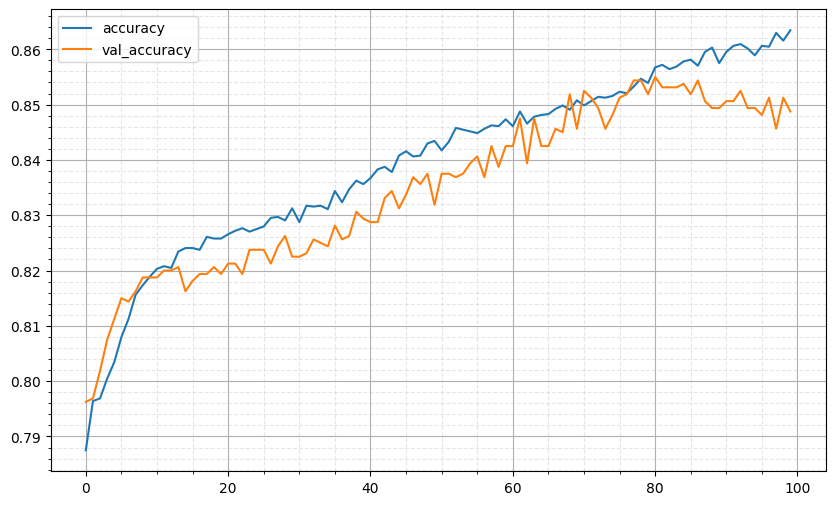

Saved image: loss-model_1.png


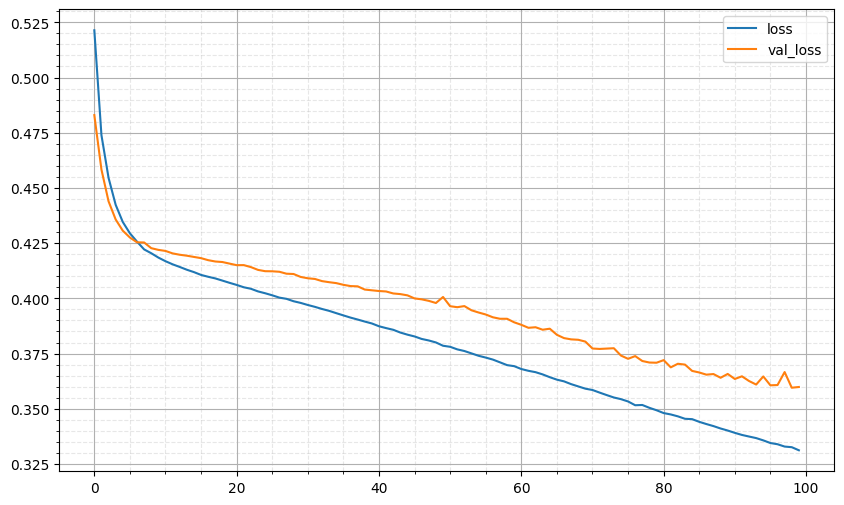

In [ ]:
#| code-summary: Fit and save the model
#| output: false
model_1_file = "model_1"

model_1, history = modt.load_or_fit_model(
    classifier, model_1_file, x=X_train, y=y_train, validation_data=(X_val, y_val), epochs=100,
    fit_model_function=fit_model_1,
    metrics=['accuracy']
)

In [ ]:
#| code-summary: Plot training and validation loss
#| label: fig-model1-loss
#| fig-cap: "Training and Validation Loss - NN"
#| fig-cap-location: margin
# Capturing learning history per epoch
hist = pd.DataFrame(history.history)
hist['epoch'] = range(1, len(hist['loss']) + 1)

fig = px.line(
    hist, x='epoch', y=['loss', 'val_loss'],
    labels={'variable': 'Data', 'value': 'Loss'},
    title='Loss vs. Epochs'
)
fig.show();

# Evaluate the model on X_test and y_test
results = model_1.evaluate(X_test, y_test)
print(f"Test loss: {results[0]}")
print(f"Test accuracy: {results[1]}")

63/63 [==============================] - 0s 2ms/step - loss: 0.3464 - accuracy: 0.8565
Test loss: 0.34641969203948975
Test accuracy: 0.8565000295639038


50/50 [==============================] - 0s 1ms/step


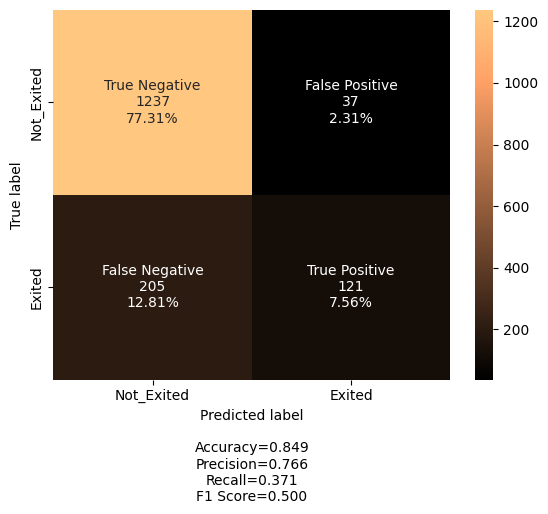

In [ ]:
#| code-summary: Build the correlation matrix
#| label: fig-model1-correlation
#| fig-cap: "Correlation matrix - NN"
#| fig-cap-location: margin
# Obtain the prediction on X_val and obtain the confusion matrix
y_pred1 = model_1.predict(X_val)

#Let's predict using default threshold
y_pred1 = (y_pred1 > 0.5)
cm1 = confusion_matrix(y_val, y_pred1)
labels = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
categories = ['Not_Exited', 'Exited']
make_confusion_matrix(
    cm1,
    group_names=labels,
    categories=categories,
    cmap='copper'
)
plt.show();

### Model Building: Neural Network model with Adam Optimizer

In [ ]:
#| code-summary: Prepare to initialize the model
backend.clear_session()
#Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [ ]:
#| code-summary: Define a function to create the model
def create_model():
    # Initializing the neural network
    model = Sequential()

    # Add the input layer with 64 neurons and relu as activation function
    model.add(Dense(64, activation='relu', input_dim=X_train.shape[1]))

    # Add the first hidden layer with 32 neurons with relu as activation functions
    model.add(Dense(32, activation='relu'))

    # Add the output layer with Sigmoid Activation
    model.add(Dense(1, activation='sigmoid'))

    # Initialize the model with Adam Optimizer
    optimizer = tf.keras.optimizers.Adam(0.001)

    # Compile the model with binary cross entropy as loss function and accuracy as metrics
    model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    return model

In [ ]:
#| code-summary: Create the model and a summary.
classifier_adam = create_model()
classifier_adam.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2,881
Trainable params: 2,881
Non-trainable params: 0
_________________________________________________________________


In [ ]:
#| code-summary: Fit the model on training data for 100 epochs
#| output: false

fit_model_2 = lambda model_2, x, y, validation_data, epochs: model_2.fit(
    X_train, y_train, validation_data=validation_data, epochs=epochs
)

# history = classifier.fit(
#     X_train, y_train,
#     validation_data=(X_val, y_val),
#     epochs=100,
#     batch_size=32
# )

Start Time: Sun Oct 29 00:51:28 2023
Epoch 1/100
200/200 [==============================] - 2s 3ms/step - loss: 0.4569 - accuracy: 0.8034 - val_loss: 0.4264 - val_accuracy: 0.8138
Epoch 2/100
200/200 [==============================] - 1s 3ms/step - loss: 0.4175 - accuracy: 0.8211 - val_loss: 0.4184 - val_accuracy: 0.8213
Epoch 3/100
200/200 [==============================] - 1s 3ms/step - loss: 0.4078 - accuracy: 0.8267 - val_loss: 0.4135 - val_accuracy: 0.8350
Epoch 4/100
200/200 [==============================] - 1s 3ms/step - loss: 0.3972 - accuracy: 0.8302 - val_loss: 0.4030 - val_accuracy: 0.8381
Epoch 5/100
200/200 [==============================] - 1s 3ms/step - loss: 0.3873 - accuracy: 0.8363 - val_loss: 0.3985 - val_accuracy: 0.8356
Epoch 6/100
200/200 [==============================] - 1s 3ms/step - loss: 0.3783 - accuracy: 0.8398 - val_loss: 0.3886 - val_accuracy: 0.8406
Epoch 7/100
200/200 [==============================] - 1s 3ms/step - loss: 0.3712 - accuracy: 0.8436 - va

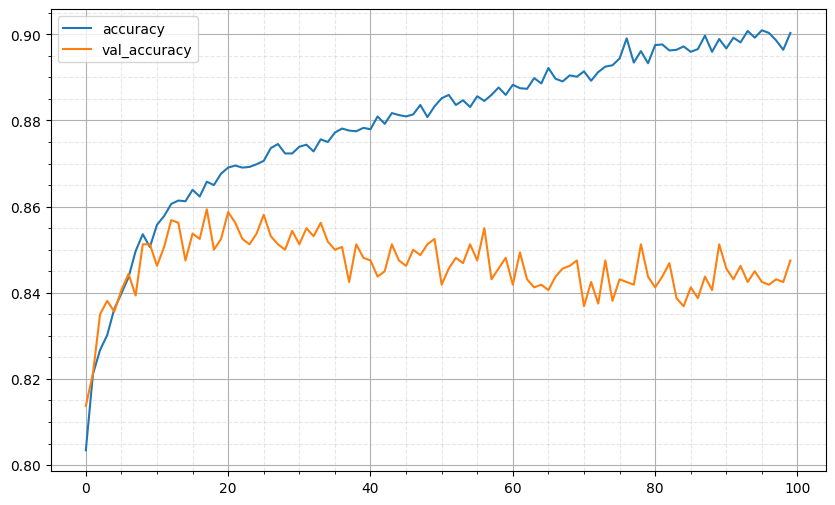

Saved image: loss-model_2.png


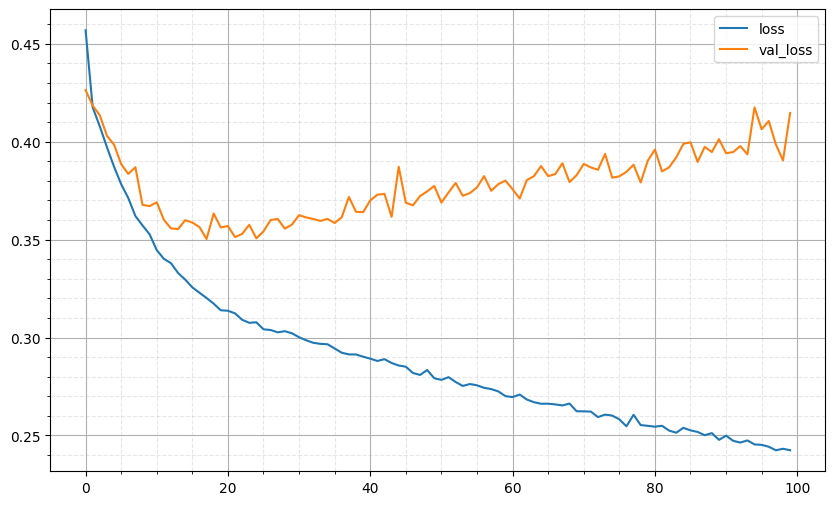

In [ ]:
#| code-summary: Fit and save the model
model_2_file = "model_2"

model_2, history = modt.load_or_fit_model(
    classifier_adam, model_2_file, x=X_train, y=y_train, validation_data=(X_val, y_val), epochs=100,
    fit_model_function=fit_model_2,
    metrics=['accuracy']
)

In [ ]:
#| code-summary: Plot training and validation loss
#| label: fig-model2-loss
#| fig-cap: "Training and Validation Loss - NN with Adam Optimizer"
#| fig-cap-location: margin
# Capturing learning history per epoch
hist = pd.DataFrame(history.history)
hist['epoch'] = range(1, len(hist['loss']) + 1)

fig = px.line(
    hist, x='epoch', y=['loss', 'val_loss'],
    labels={'variable': 'Data', 'value': 'Loss'},
    title='Loss vs. Epochs'
)
fig.show();

# Evaluate the model on X_test and y_test
results = classifier_adam.evaluate(X_test, y_test)
print(f"Test loss: {results[0]}")
print(f"Test accuracy: {results[1]}")

63/63 [==============================] - 0s 2ms/step - loss: 0.4058 - accuracy: 0.8530
Test loss: 0.405815064907074
Test accuracy: 0.8529999852180481


- This plot shows that the model is overfitting. Early stopping can help prevent this.

In [ ]:
#| code-summary: Create the model with early stopping.
#| output: false

classifier_adam_cb = create_model()

fit_model_2_cb = lambda model_2_cb, x, y, validation_data, epochs: model_2_cb.fit(
    X_train, y_train, validation_data=validation_data, epochs=epochs, callbacks=[early_callback]
)

Start Time: Sun Oct 29 00:52:32 2023
Epoch 1/100
200/200 [==============================] - 2s 4ms/step - loss: 0.4583 - accuracy: 0.7894 - val_loss: 0.4269 - val_accuracy: 0.8156
Epoch 2/100
200/200 [==============================] - 1s 3ms/step - loss: 0.4146 - accuracy: 0.8198 - val_loss: 0.4134 - val_accuracy: 0.8256
Epoch 3/100
200/200 [==============================] - 1s 3ms/step - loss: 0.4006 - accuracy: 0.8314 - val_loss: 0.4041 - val_accuracy: 0.8381
Epoch 4/100
200/200 [==============================] - 1s 3ms/step - loss: 0.3855 - accuracy: 0.8383 - val_loss: 0.3873 - val_accuracy: 0.8381
Epoch 5/100
200/200 [==============================] - 1s 3ms/step - loss: 0.3730 - accuracy: 0.8436 - val_loss: 0.3773 - val_accuracy: 0.8375
Epoch 6/100
200/200 [==============================] - 1s 3ms/step - loss: 0.3622 - accuracy: 0.8497 - val_loss: 0.3709 - val_accuracy: 0.8406
Epoch 7/100
200/200 [==============================] - 1s 3ms/step - loss: 0.3543 - accuracy: 0.8544 - va

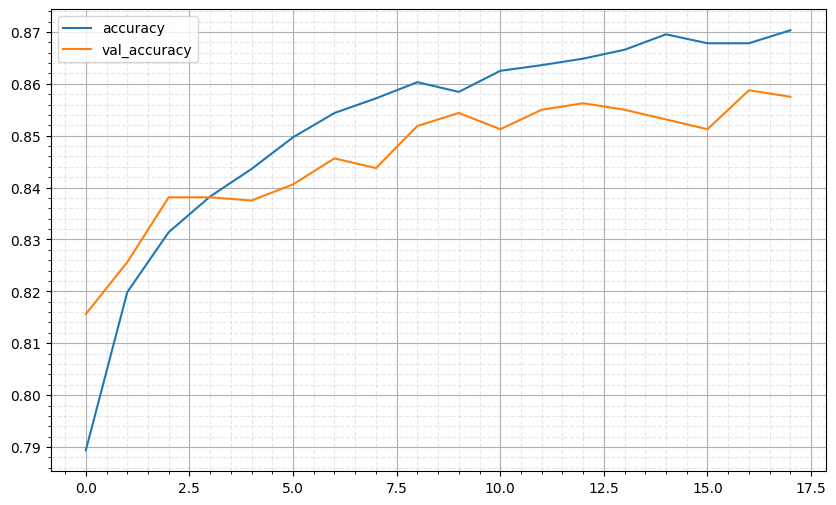

Saved image: loss-model_2_cb.png


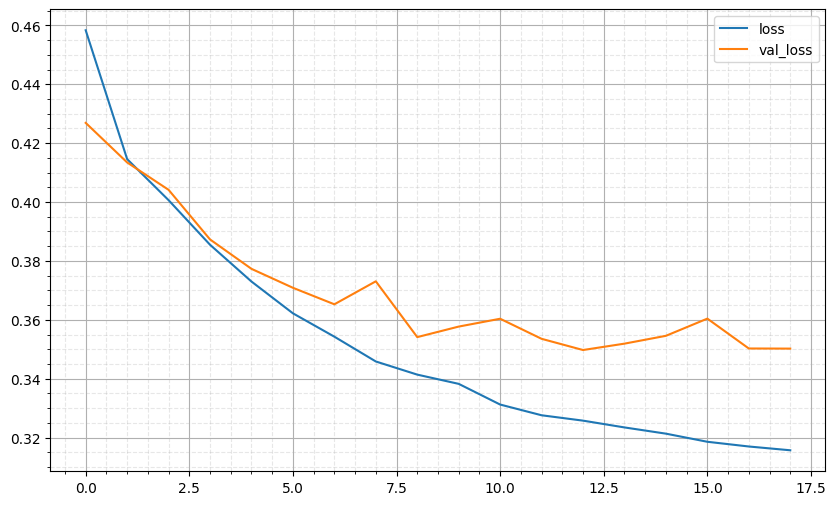

In [ ]:
#| code-summary: Fit and save the model
#| output: false
model_2_cb_file = "model_2_cb"
early_callback = callbacks.EarlyStopping(monitor='val_loss', min_delta=0.001, patience=5)

model_2_cb, history = modt.load_or_fit_model(
    classifier_adam_cb, model_2_cb_file, x=X_train, y=y_train, validation_data=(X_val, y_val), epochs=100,
    fit_model_function=fit_model_2_cb,
    metrics=['accuracy']
)

In [ ]:
# # Importing classback API
# # Defining Early stopping
# es_cb = callbacks.EarlyStopping(monitor='val_loss', min_delta=0.001, patience=5)
#
# # Call the create_model() function
# model_e = create_model()
#
# # Train the model on X_train and y_train for 100 epochs and also use X_val and y_val as validation_data
# history_e = model_e.fit(
#     X_train, y_train, batch_size=32, epochs=100, verbose=1, validation_data=(X_val, y_val),
#     callbacks=[es_cb]
#)

In [ ]:
#| code-summary: Plot training and validation loss
#| label: fig-model2-loss-es
#| fig-cap: "Training and Validation Loss - NN with Adam Optimizer and Early Stopping"
#| fig-cap-location: margin
# Capturing learning history per epoch
hist = pd.DataFrame(history.history)
hist['epoch'] = range(1, len(hist['loss']) + 1)

fig = px.line(
    hist, x='epoch', y=['loss', 'val_loss'],
    labels={'variable': 'Data', 'value': 'Loss'},
    title='Loss vs. Epochs'
)
fig.show();

# Evaluate the model on X_test and y_test
results = classifier_adam_cb.evaluate(X_test, y_test)
print(f"Test loss: {results[0]}")
print(f"Test accuracy: {results[1]}")

63/63 [==============================] - 0s 2ms/step - loss: 0.3387 - accuracy: 0.8635
Test loss: 0.3386671841144562
Test accuracy: 0.8634999990463257


- This is still overfitting slightly, but is performing much better than before.

In [ ]:
#| code-summary: Build the ROC curve
#| label: fig-model2-roc
#| fig-cap: "ROC Curve"
#| fig-cap-location: margin
# predict probabilities
yhat = model_2_cb.predict(X_train)

# keep probabilities for the positive outcome only
yhat = yhat[:, 0]

# calculate roc curves
fpr, tpr, thresholds = roc_curve(y_train, yhat)

# calculate the g-mean for each threshold
gmeans = np.sqrt(tpr * (1 - fpr))

# locate the index of the largest g-mean
ix = np.argmax(gmeans)

# Create a DataFrame for the ROC data
df_roc = pd.DataFrame(
    {
        'FPR': fpr,
        'TPR': tpr
    }
)

fig = px.line(df_roc, x='FPR', y='TPR', title='ROC Curve')
fig.add_scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='No Skill')
fig.add_scatter(
    x=[fpr[ix]], y=[tpr[ix]], mode='markers', marker_symbol='circle', marker_size=10,
    name=f'Best (Threshold={thresholds[ix]:.3f}, G-Mean={gmeans[ix]:.3f})'
)

# Update axis labels
fig.update_layout(
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    autosize=True,
    # width=500,
    # height=500,
    # margin=dict(l=50, r=50, b=100, t=100)
)

fig.show();

200/200 [==============================] - 0s 1ms/step


In [ ]:
#| code-summary: Predicting the results using best as a threshold
y_pred_e = model_2_cb.predict(X_val)
y_pred_e = (y_pred_e > thresholds[ix])
y_pred_e

50/50 [==============================] - 0s 1ms/step


array([[ True],
       [False],
       [False],
       ...,
       [False],
       [ True],
       [ True]])

In [ ]:
#| code-summary: Build the classification report
cr = metrics.classification_report(y_val, y_pred_e)
print(cr)

              precision    recall  f1-score   support

         0.0       0.92      0.84      0.88      1274
         1.0       0.53      0.73      0.61       326

    accuracy                           0.81      1600
   macro avg       0.73      0.78      0.75      1600
weighted avg       0.84      0.81      0.82      1600



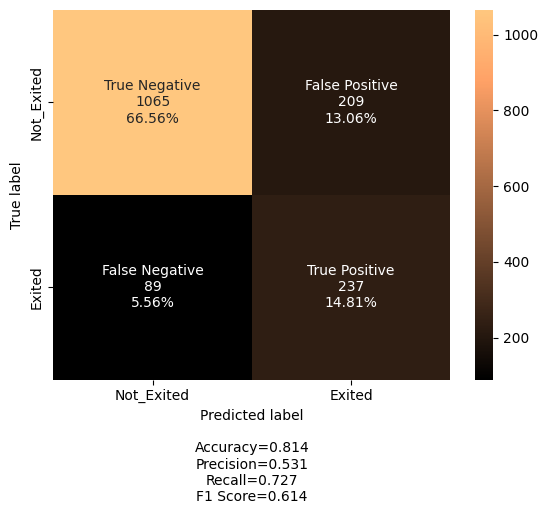

In [ ]:
#| code-summary: Build the correlation matrix
#| label: fig-model2-correlation
#| fig-cap: "Correlation matrix - NN with Adam Optimizer"
#| fig-cap-location: margin
cm2 = confusion_matrix(y_val, y_pred_e)
labels = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
categories = ['Not_Exited', 'Exited']
make_confusion_matrix(
    cm2,
    group_names=labels,
    categories=categories,
    cmap='copper'
)
plt.show();

### Model Improvement: Neural Network model with Dropout

In [ ]:
#| code-summary: Prepare to initialize the model
backend.clear_session()
#Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [ ]:
#| code-summary: Initializing the neural network
model_3 = Sequential()

#Adding the input layer with 32 neurons and relu as activation function
model_3.add(Dense(32, activation='relu', input_dim=X_train.shape[1]))

# Complete the code to add dropout with dropout_rate= 0.2
model_3.add(Dropout(0.2))

# Adding the first hidden layer with 16 neurons with relu as activation functions
model_3.add(Dense(16, activation='relu'))

# Complete the code to add dropout with dropout_rate= 0.1
model_3.add(Dropout(0.1))
# Adding the second hidden layer with 8 neurons with relu as activation functions
model_3.add(Dense(8, activation='relu'))

# Adding the output layer
model_3.add(Dense(1, activation='sigmoid'))

In [ ]:
#| code-summary: Summary of the model
model_3.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                384       
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dropout_1 (Dropout)         (None, 16)                0         
                                                                 
 dense_2 (Dense)             (None, 8)                 136       
                                                                 
 dense_3 (Dense)             (None, 1)                 9         
                                                                 
Total params: 1,057
Trainable params: 1,057
Non-trainabl

In [ ]:
#| code-summary: Initialize the ANN with Adam optimizer
optimizer = tf.keras.optimizers.Adam(0.001)

# Compile the model with binary cross entropy as loss function and accuracy as metrics
model_3.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

In [ ]:
#| code-summary: Fitting the ANN with batch_size = 32 and 100 epochs
#| output: false

fit_model_3 = lambda model_3, x, y, validation_data, epochs: model_3.fit(
    X_train, y_train, validation_data=validation_data, epochs=epochs, callbacks=[early_callback]
)

# history = classifier.fit(
#     X_train, y_train,
#     validation_data=(X_val, y_val),
#     epochs=100,
#     batch_size=32
# )

# history_3 = model_3.fit(
# X_train, y_train, batch_size = 32, epochs = 100, verbose = 1, validation_data = (X_val, y_val), callbacks = [es_cb]
# )

Start Time: Sun Oct 29 00:52:59 2023
Epoch 1/100
200/200 [==============================] - 3s 4ms/step - loss: 0.6817 - accuracy: 0.6577 - val_loss: 0.6197 - val_accuracy: 0.7962
Epoch 2/100
200/200 [==============================] - 1s 3ms/step - loss: 0.5099 - accuracy: 0.7962 - val_loss: 0.4526 - val_accuracy: 0.7962
Epoch 3/100
200/200 [==============================] - 1s 3ms/step - loss: 0.4478 - accuracy: 0.7958 - val_loss: 0.4388 - val_accuracy: 0.7962
Epoch 4/100
200/200 [==============================] - 1s 3ms/step - loss: 0.4364 - accuracy: 0.7984 - val_loss: 0.4341 - val_accuracy: 0.7950
Epoch 5/100
200/200 [==============================] - 1s 3ms/step - loss: 0.4308 - accuracy: 0.8000 - val_loss: 0.4267 - val_accuracy: 0.8044
Epoch 6/100
200/200 [==============================] - 1s 3ms/step - loss: 0.4286 - accuracy: 0.8120 - val_loss: 0.4207 - val_accuracy: 0.8213
Epoch 7/100
200/200 [==============================] - 1s 3ms/step - loss: 0.4201 - accuracy: 0.8214 - va

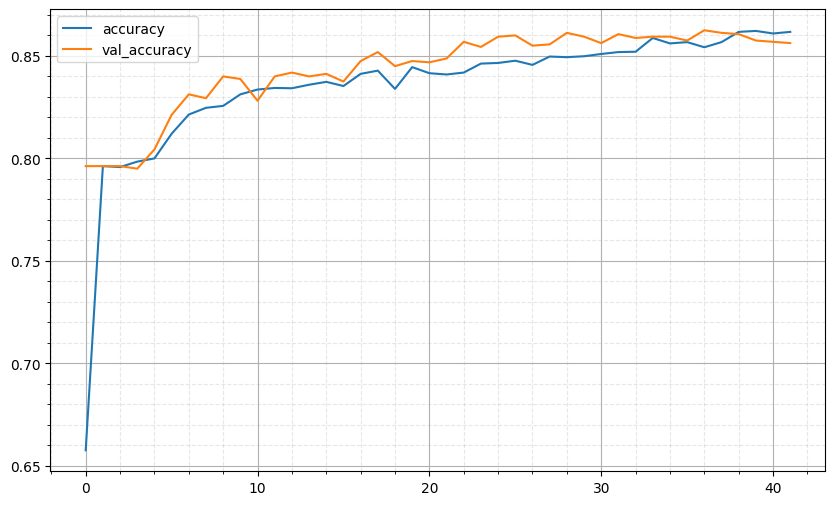

Saved image: loss-model_3.png


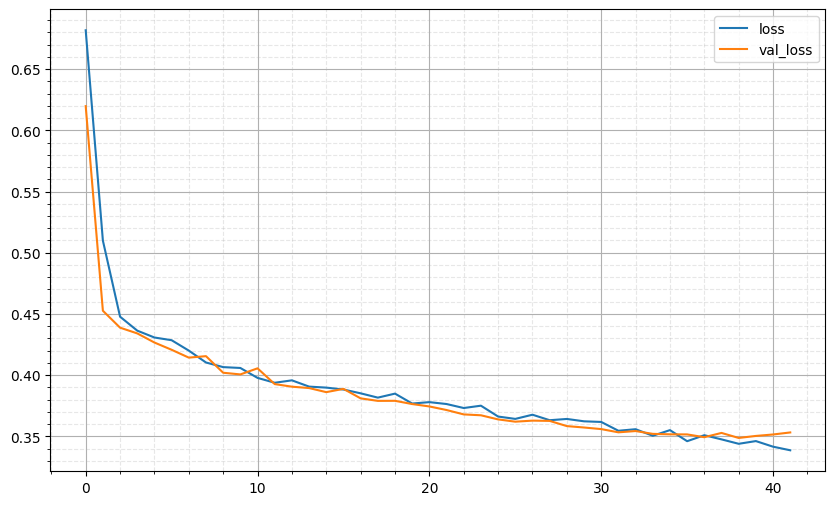

In [ ]:
#| code-summary: Fit and save the model
#| output: false
model_3_file = "model_3"
early_callback = callbacks.EarlyStopping(monitor='val_loss', min_delta=0.001, patience=5)

model_3, history = modt.load_or_fit_model(
    model_3, model_3_file, x=X_train, y=y_train, validation_data=(X_val, y_val), epochs=100,
    fit_model_function=fit_model_3,
    metrics=['accuracy']
)

In [ ]:
#| code-summary: Plot training and validation loss
#| label: fig-model3-loss
#| fig-cap: "Training and Validation Loss - NN with Dropout and Early Stopping"
#| fig-cap-location: margin
# Capturing learning history per epoch
hist = pd.DataFrame(history.history)
hist['epoch'] = range(1, len(hist['loss']) + 1)

fig = px.line(
    hist, x='epoch', y=['loss', 'val_loss'],
    labels={'variable': 'Data', 'value': 'Loss'},
    title='Loss vs. Epochs'
)
fig.show();

# Evaluate the model on X_test and y_test
results = model_3.evaluate(X_test, y_test);
print(f"Test loss: {results[0]}")
print(f"Test accuracy: {results[1]}")

63/63 [==============================] - 0s 2ms/step - loss: 0.3376 - accuracy: 0.8635
Test loss: 0.3375896215438843
Test accuracy: 0.8634999990463257


In [ ]:
#| code-summary: Build the ROC curve
#| label: fig-model3-roc
#| fig-cap: "ROC Curve"
#| fig-cap-location: margin
# predict probabilities
yhat = model_3.predict(X_train)

# keep probabilities for the positive outcome only
yhat = yhat[:, 0]

# calculate roc curves
fpr, tpr, thresholds = roc_curve(y_train, yhat)

# calculate the g-mean for each threshold
gmeans = np.sqrt(tpr * (1 - fpr))

# locate the index of the largest g-mean
ix = np.argmax(gmeans)

# Create a DataFrame for the ROC data
df_roc = pd.DataFrame(
    {
        'FPR': fpr,
        'TPR': tpr
    }
)

fig = px.line(df_roc, x='FPR', y='TPR', title='ROC Curve')
fig.add_scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='No Skill')
fig.add_scatter(
    x=[fpr[ix]], y=[tpr[ix]], mode='markers', marker_symbol='circle', marker_size=10,
    name=f'Best (Threshold={thresholds[ix]:.3f}, G-Mean={gmeans[ix]:.3f})'
)

# Update axis labels
fig.update_layout(
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    autosize=True,
    # width=500,
    # height=500,
    # margin=dict(l=50, r=50, b=100, t=100)
)

fig.show();

200/200 [==============================] - 0s 1ms/step


In [ ]:
#| code-summary: Predicting the results using best as a threshold
y_pred_3 = model_3.predict(X_val)
y_pred_3 = (y_pred_3 > thresholds[ix])
y_pred_3

50/50 [==============================] - 0s 1ms/step


array([[False],
       [False],
       [False],
       ...,
       [False],
       [ True],
       [ True]])

In [ ]:
#| code-summary: Obtain the classification report
cr = metrics.classification_report(y_val, y_pred_3)
print(cr)

              precision    recall  f1-score   support

         0.0       0.93      0.80      0.86      1274
         1.0       0.49      0.75      0.60       326

    accuracy                           0.79      1600
   macro avg       0.71      0.78      0.73      1600
weighted avg       0.84      0.79      0.81      1600



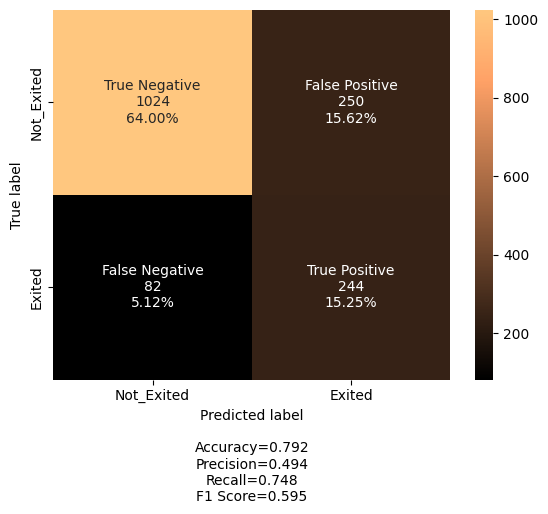

In [ ]:
#| code-summary: Build the correlation matrix
#| label: fig-model3-correlation
#| fig-cap: "Correlation matrix - NN with Dropout"
#| fig-cap-location: margin
cm3 = confusion_matrix(y_val, y_pred_3)
labels = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
categories = ['Not_Exited', 'Exited']
make_confusion_matrix(
    cm3,
    group_names=labels,
    categories=categories,
    cmap='copper'
)
plt.show();

### Model Improvement: Neural Network model with Hyperparameter tuning

In [ ]:
#| code-summary: Prepare to initialize the model
backend.clear_session()
# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [ ]:
#| code-summary: Define a function for creating the model
def create_model_v2(dropout_rate=0.1, lr=0.001, layer_1=64, layer_2=32):
    np.random.seed(42)

    #Initializing the neural network
    model = Sequential()

    # This adds the input layer (by specifying input dimension)
    model.add(Dense(layer_1, activation='relu', input_dim=X_train.shape[1]))

    model.add(Dropout(0.5))

    # # Adding the hidden layer
    model.add(Dense(layer_2, activation='relu'))

    # # Adding the output layer
    # we have an output of 1 node, which is the desired dimension of our output (stay with the bank or not)
    # We use the sigmoid because we want probability outcomes
    model.add(Dense(1, activation='sigmoid'))

    # Adding Adam initializer
    optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

    ## Complete the code to compile the model using binary_crossentropy as loss
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

In [ ]:
#| code-summary: Define the KerasClassifier
keras_estimator = KerasClassifier(build_fn=create_model_v2, verbose=1)

In [ ]:
#| code-summary: define the grid search parameters
param_grid = {
    'batch_size': [40, 64, 128],
    "lr": [0.01, 0.001, 0.1]
}

kfold_splits = 3

grid = GridSearchCV(
    estimator=keras_estimator,
    verbose=1,
    cv=kfold_splits,
    param_grid=param_grid, n_jobs=2
)

In [ ]:
# NOTE - Kaggle reports CUDA OOM error, but works on local system. Commenting here to retain code
###############################################

# Fit the model on train data and use x_val and y_val as validation data

# grid_result = grid.fit(X_train, y_train, validation_data=(X_val, y_val), verbose=1)

# # Summarize results
# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# # Printing mean
# means = grid_result.cv_results_['mean_test_score']
# # Printing standard deviation
# stds = grid_result.cv_results_['std_test_score']
# # Printing best parameters
# params = grid_result.cv_results_['params']

In [ ]:
#| code-summary: Create the model and a summary.
# Creating the model
# estimator_v2 = create_model_v2(lr=grid_result.best_params_['lr'])
# # Printing model summary
# estimator_v2.summary()

In [ ]:
#| code-summary: Define the model fitting function
#| output: false

# fit_model_4 = lambda model_4, x, y, validation_data, epochs: model_4.fit(
#     X_train, y_train, validation_data=validation_data, epochs=epochs, callbacks=[early_callback]
# )

In [ ]:
#| code-summary: Fit and save the model
#| output: false
# model_4_file = "model_4"
# early_callback = callbacks.EarlyStopping(monitor='val_loss', min_delta=0.001, patience=5)

# model_4, history = modt.load_or_fit_model(
#     estimator_v2, model_4_file, x=X_train, y=y_train, validation_data=(X_val, y_val), epochs=100,
#     fit_model_function=fit_model_4,
#     metrics=['accuracy']
# )

In [ ]:
# # Fit the model on train data and train the model with the best batch_size obtained from hyperparameter tuning
# history_h = estimator_v2.fit(
#     X_train, y_train, epochs=100, batch_size=grid_result.best_params_['batch_size'], verbose=1,
#     validation_data=(X_val, y_val)
# )

In [ ]:
#| code-summary: Plot training and validation loss
#| label: fig-model4-loss
#| fig-cap: "Training and Validation Loss - NN with Hyperparameter Tuning"
#| fig-cap-location: margin
# Capturing learning history per epoch
# hist = pd.DataFrame(history)
# hist['epoch'] = range(1, len(history['loss']) + 1)

# fig = px.line(
#     hist, x='epoch', y=['loss', 'val_loss'],
#     labels={'variable': 'Data', 'value': 'Loss'},
#     title='Loss vs. Epochs'
# )
# fig.show();

# # Evaluate the model on X_test and y_test
# results = estimator_v2.evaluate(X_test, y_test);
# print(f"Test loss: {results[0]}")
# print(f"Test accuracy: {results[1]}")

In [ ]:
#| code-summary: Build the ROC curve
#| label: fig-model4-roc
#| fig-cap: "ROC Curve"
#| fig-cap-location: margin
# predict probabilities
# yhat = model_4.predict(X_train)

# # keep probabilities for the positive outcome only
# yhat = yhat[:, 0]

# # calculate roc curves
# fpr, tpr, thresholds = roc_curve(y_train, yhat)

# # calculate the g-mean for each threshold
# gmeans = np.sqrt(tpr * (1 - fpr))

# # locate the index of the largest g-mean
# ix = np.argmax(gmeans)

# # Create a DataFrame for the ROC data
# df_roc = pd.DataFrame(
#     {
#         'FPR': fpr,
#         'TPR': tpr
#     }
# )

# fig = px.line(df_roc, x='FPR', y='TPR', title='ROC Curve')
# fig.add_scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='No Skill')
# fig.add_scatter(
#     x=[fpr[ix]], y=[tpr[ix]], mode='markers', marker_symbol='circle', marker_size=10,
#     name=f'Best (Threshold={thresholds[ix]:.3f}, G-Mean={gmeans[ix]:.3f})'
# )

# # Update axis labels
# fig.update_layout(
#     xaxis_title='False Positive Rate',
#     yaxis_title='True Positive Rate',
#     autosize=True,
#     # width=500,
#     # height=500,
#     # margin=dict(l=50, r=50, b=100, t=100)
# )

# fig.show();

In [ ]:
#| code-summary: Obtain the predictions on X_val
# y_pred_h = estimator_v2.predict(X_val)
# print(y_pred_h)

In [ ]:
#| code-summary: Convert the probabilities that a customer will leave the bank into the form true or false.
# To use the confusion Matrix, we need to convert the probabilities that a customer will leave the bank into the form true or false.
# So we will use the best cutoff value  to indicate whether they are likely to exit or not.
# y_pred_h = (y_pred_h > thresholds[ix])
# print(y_pred_h)

In [ ]:
#| code-summary: Obtain the classification report
# cr = metrics.classification_report(y_val, y_pred_h)
# print(cr)

In [ ]:
#| code-summary: Obtain the confusion matrix
#| label: fig-model4-correlation
#| fig-cap: "Correlation matrix - NN with Hyperparameter Tuning"
#| fig-cap-location: margin
# cm_h = confusion_matrix(y_val, y_pred_h)

# labels = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
# categories = ['Not_Exited', 'Exited']
# make_confusion_matrix(
#     cm_h,
#     group_names=labels,
#     categories=categories,
#     cmap='copper'
# )

### Model Improvement: Neural Network model with balanced data

In [ ]:
#| code-summary: Apply SMOTE on train data
sm = SMOTE(random_state=42)
X_train_sm, y_train_sm = sm.fit_resample(X_train, y_train)
print('After UpSampling, the shape of train_X: {}'.format(X_train_sm.shape))
print('After UpSampling, the shape of train_y: {} \n'.format(y_train_sm.shape))

After UpSampling, the shape of train_X: (10192, 11)
After UpSampling, the shape of train_y: (10192,) 



In [ ]:
#| code-summary: Prepare to initialize the model
backend.clear_session()
#Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [ ]:
#| code-summary: Initilaize a sequential model
model_5 = Sequential()

# Add an input layer of 32 neurons with relu as activation function
model_5.add(Dense(32, activation='relu', input_dim=X_train_sm.shape[1]))

# Add dropout with dropout rate=0.2
model_5.add(Dropout(0.2))
# Adding hidden layer with 16 neurons with relu as activation function
model_5.add(Dense(16, activation='relu'))

# Adding the dropout
model_5.add(Dropout(0.1))

# Add dense layers with 8 neurons
model_5.add(Dense(8, activation='relu'))

# Add a suitable activation function in the final layer
model_5.add(Dense(1, activation='sigmoid'))

In [ ]:
#| code-summary: Summarize the model
model_5.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                384       
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dropout_1 (Dropout)         (None, 16)                0         
                                                                 
 dense_2 (Dense)             (None, 8)                 136       
                                                                 
 dense_3 (Dense)             (None, 1)                 9         
                                                                 
Total params: 1,057
Trainable params: 1,057
Non-trainabl

Start Time: Sun Oct 29 00:53:57 2023
Epoch 1/100
319/319 [==============================] - 3s 4ms/step - loss: 0.6602 - accuracy: 0.6120 - val_loss: 0.6829 - val_accuracy: 0.6988
Epoch 2/100
319/319 [==============================] - 1s 3ms/step - loss: 0.6134 - accuracy: 0.7083 - val_loss: 0.6314 - val_accuracy: 0.7431
Epoch 3/100
319/319 [==============================] - 1s 3ms/step - loss: 0.5874 - accuracy: 0.7189 - val_loss: 0.6037 - val_accuracy: 0.7425
Epoch 4/100
319/319 [==============================] - 1s 4ms/step - loss: 0.5662 - accuracy: 0.7339 - val_loss: 0.5809 - val_accuracy: 0.7538
Epoch 5/100
319/319 [==============================] - 1s 3ms/step - loss: 0.5455 - accuracy: 0.7469 - val_loss: 0.5491 - val_accuracy: 0.7769
Epoch 6/100
319/319 [==============================] - 1s 3ms/step - loss: 0.5329 - accuracy: 0.7535 - val_loss: 0.5665 - val_accuracy: 0.7469
Epoch 7/100
319/319 [==============================] - 1s 3ms/step - loss: 0.5213 - accuracy: 0.7607 - va

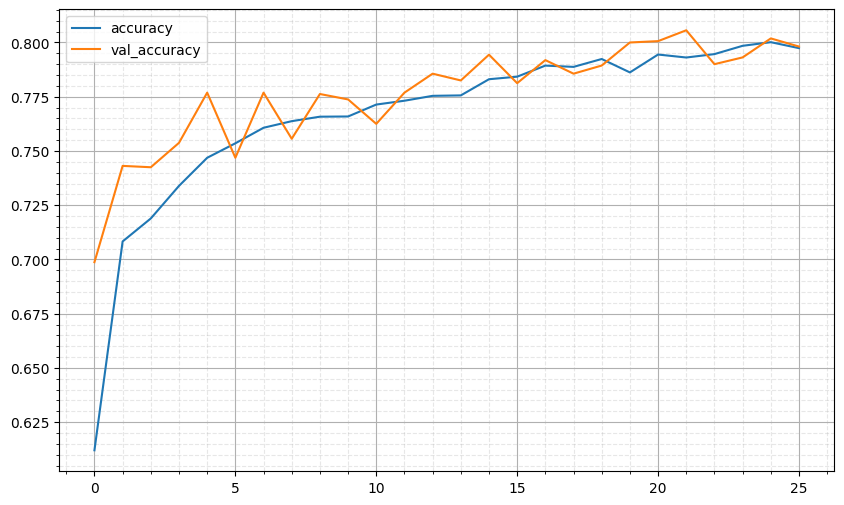

Saved image: loss-model_5.png


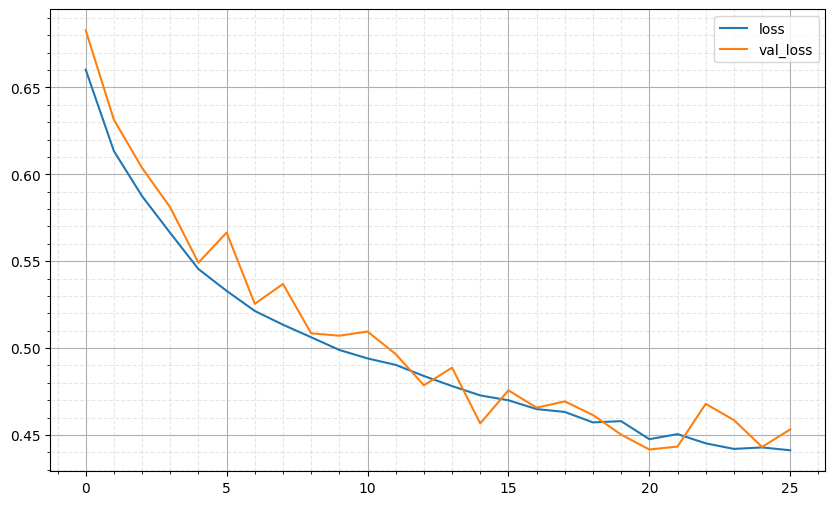

In [ ]:
#| code-summary: Define, fit and save the model
#| output: false
# Complete the code to define earlystopping as callback
early_callback = callbacks.EarlyStopping(monitor='val_loss', min_delta=0.001, patience=5)

# Initializing Adam optimizer
optimizer = tf.keras.optimizers.Adam(0.001)

# Compiling the model with binary cross entropy as loss and accuracy as metrics
model_5.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

fit_model_5 = lambda model_5, x, y, validation_data, epochs: model_5.fit(
    X_train_sm, y_train_sm, validation_data=validation_data, epochs=epochs, callbacks=[early_callback]
)

model_5_file = "model_5"
early_callback = callbacks.EarlyStopping(monitor='val_loss', min_delta=0.001, patience=5)

model_5, history = modt.load_or_fit_model(
    model_5, model_5_file, x=X_train_sm, y=y_train_sm, validation_data=(X_val, y_val), epochs=100,
    fit_model_function=fit_model_5,
    metrics=['accuracy']
)

In [ ]:
#| code-summary: Plot training and validation loss
#| label: fig-model5-loss
#| fig-cap: "Training and Validation Loss - NN with SMOTE"
#| fig-cap-location: margin
# Capturing learning history per epoch
hist = pd.DataFrame(history.history)
hist['epoch'] = range(1, len(hist['loss']) + 1)

fig = px.line(
    hist, x='epoch', y=['loss', 'val_loss'],
    labels={'variable': 'Data', 'value': 'Loss'},
    title='Loss vs. Epochs'
)
fig.show();

# Evaluate the model on X_test and y_test
results = model_5.evaluate(X_test, y_test);
print(f"Test loss: {results[0]}")
print(f"Test accuracy: {results[1]}")

63/63 [==============================] - 0s 2ms/step - loss: 0.4430 - accuracy: 0.7995
Test loss: 0.44301632046699524
Test accuracy: 0.7994999885559082


In [ ]:
#| code-summary: Build the ROC curve
#| label: fig-model5-roc
#| fig-cap: "ROC Curve"
#| fig-cap-location: margin
# predict probabilities
yhat = model_5.predict(X_train_sm)

# keep probabilities for the positive outcome only
yhat = yhat[:, 0]

# calculate roc curves
fpr, tpr, thresholds = roc_curve(y_train_sm, yhat)

# calculate the g-mean for each threshold
gmeans = np.sqrt(tpr * (1 - fpr))

# locate the index of the largest g-mean
ix = np.argmax(gmeans)

# Create a DataFrame for the ROC data
df_roc = pd.DataFrame(
    {
        'FPR': fpr,
        'TPR': tpr
    }
)

fig = px.line(df_roc, x='FPR', y='TPR', title='ROC Curve')
fig.add_scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='No Skill')
fig.add_scatter(
    x=[fpr[ix]], y=[tpr[ix]], mode='markers', marker_symbol='circle', marker_size=10,
    name=f'Best (Threshold={thresholds[ix]:.3f}, G-Mean={gmeans[ix]:.3f})'
)

# Update axis labels
fig.update_layout(
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    autosize=True,
    # width=500,
    # height=500,
    # margin=dict(l=50, r=50, b=100, t=100)
)

fig.show();

319/319 [==============================] - 0s 1ms/step


In [ ]:
#| code-summary: Obtain the predictions on X_val
y_pred_s = model_5.predict(X_val)
#Predicting the results using tuned threshold
y_pred_s = (y_pred_s > thresholds[ix])
y_pred_s

50/50 [==============================] - 0s 1ms/step


array([[False],
       [False],
       [False],
       ...,
       [False],
       [ True],
       [ True]])

In [ ]:
#| code-summary: Display the classification report
cr = metrics.classification_report(y_val, y_pred_s)
print(cr)

              precision    recall  f1-score   support

         0.0       0.93      0.78      0.85      1274
         1.0       0.48      0.77      0.59       326

    accuracy                           0.78      1600
   macro avg       0.70      0.78      0.72      1600
weighted avg       0.84      0.78      0.80      1600



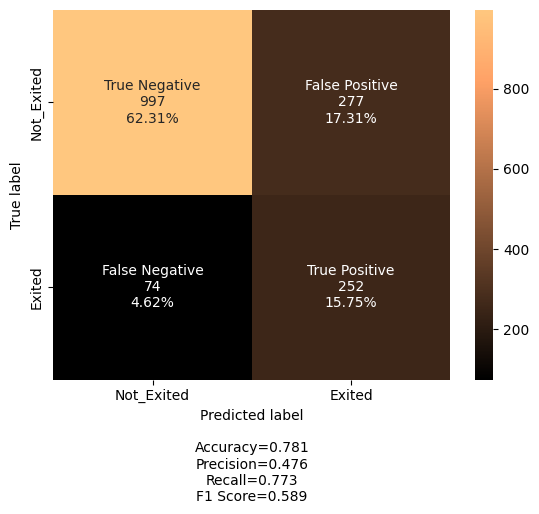

In [ ]:
#| code-summary: Calculating the confusion matrix
#| label: fig-model5-correlation
#| fig-cap: "Correlation matrix - NN with SMOTE"
#| fig-cap-location: margin
cm_s = confusion_matrix(y_val, y_pred_s)
labels = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
categories = ['Not_Exited', 'Exited']
make_confusion_matrix(
    cm_s,
    group_names=labels,
    categories=categories,
    cmap='copper'
)

Loading existing model file: model_5.h5


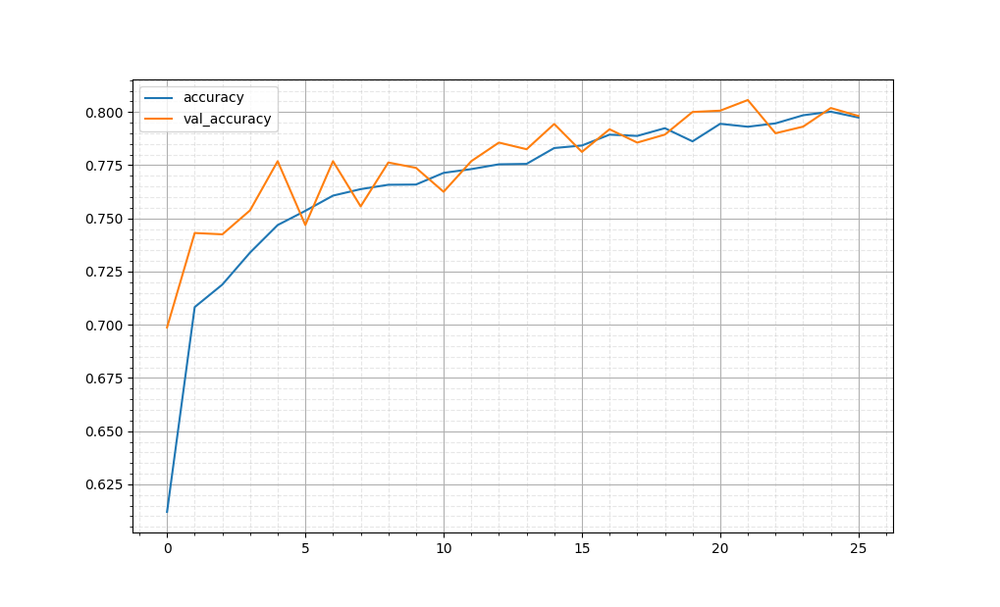

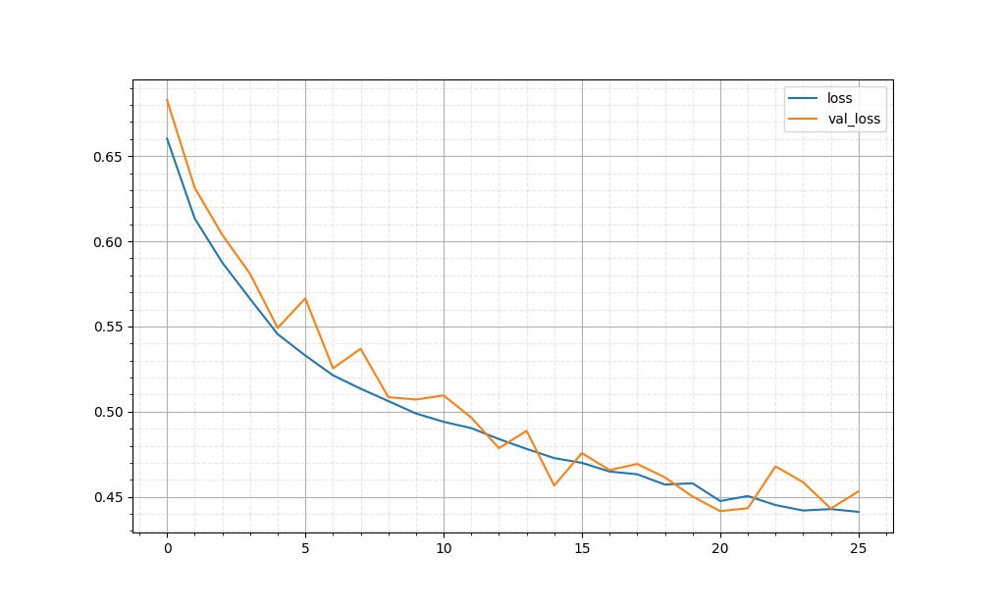

In [ ]:
#| output: false
model_5, history = modt.load_or_fit_model(
    model_5, model_5_file, x=X_train_sm, y=y_train_sm, validation_data=(X_val, y_val), epochs=100,
    fit_model_function=fit_model_5,
    metrics=['accuracy']
)
# explainer = shap.DeepExplainer(model_5, X_train_sm[:100].values)
explainer = shap.Explainer(model_5, X_train_sm.values)

In [ ]:
#| output: false
shap_values = explainer(X_test.sample(500))

Permutation explainer: 501it [00:53,  8.16it/s]


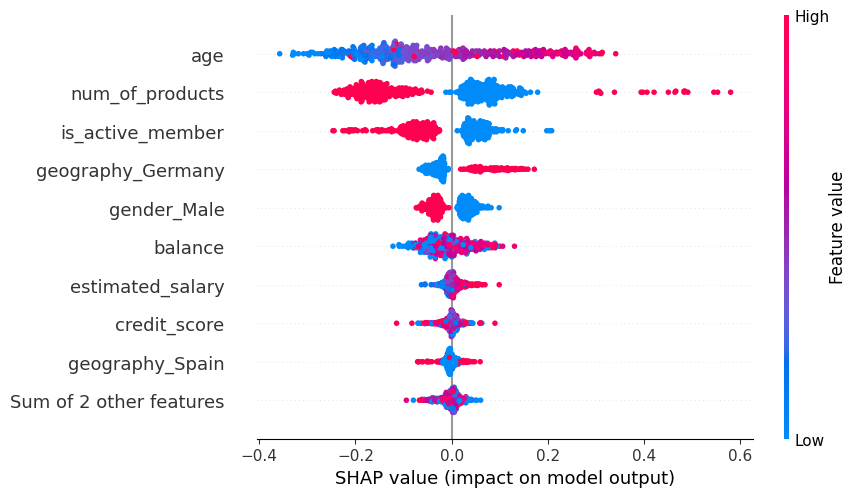

In [ ]:
#| label: fig-shap
#| fig-cap: "SHAP Values"
#| fig-cap-location: margin
shap.initjs()
shap.plots.beeswarm(shap_values)

- Older customers are more likely to churn
- With the exception of a few potential outliers, customers with less products are more likely to churn.
- Inactive members are more likely to churn.

## Final Model

- Reviewing the above results, [@fig-model3-correlation; @fig-model5-correlation] are both very similar, with
[@fig-model5-correlation] slightly taking the lead as the best model.
    - It has the lowest number of false positives, and the highest recall.

## Actionable Insights and Recommendations

**What recommedations would you suggest to the bank?**

* Older customers are more prone to churning, as seen in [@fig-shap]. Focusing on incentives for older customers
could help retain them. Further research into why younger customers tend to stay or why older customers are churning
may yield additional insights.
    * Further investigation may be needed to determine what age this difference occurs at.
* Customers who use more products are less likely to churn. Providing incentives for customers with multiple products
 may help mitigate customer churn.
 * Active members are also less likely to churn. Providing incentives such as cashback programs, fee waivers, points
 systems, or tiered bonuses may help increase customer activity, thereby reducing churn.  
  * Further modeling such as cluster analysis, temporal analysis, and exit surveys may lead to additional insights
  and recommendations.

___